In [50]:
using Plots
using DifferentialEquations
using BenchmarkTools
using ForwardDiff
using ModelingToolkit
using MethodOfLines
using DomainSets


In [51]:
@parameters x t
@variables u(..)
Dtt = Differential(t)^2
Dx4 = Differential(x)^4

q(x,t) = sin(x)

x_min = t_min = 0.0
x_max = 10.0
t_max = 11.5

u0(x,t) = 0.0
du0(x) = 0.0

eq = [Dtt(u(x,t)) ~ q(x,t) - Dx4(u(x,t))]

domains = [x ∈ Interval(x_min, x_max),
              t ∈ Interval(t_min, t_max)]

# Periodic BCs
bcs = [u(x,0) ~ u0(x,0),
    Dt(u(x, 0)) ~ du0(x)] 

@named pdesys = PDESystem(eq,bcs,domains,[x,t],[u(x,t)])


PDESystem
Equations: Equation[Differential(t)(Differential(t)(u(x, t))) ~ sin(x) - Differential(x)(Differential(x)(Differential(x)(Differential(x)(u(x, t)))))]
Boundary Conditions: Equation[u(x, 0) ~ 0.0, Differential(t)(u(x, 0)) ~ 0.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 10.0), Symbolics.VarDomainPairing(t, 0.0 .. 11.5)]
Dependent Variables: Num[u(x, t)]
Independent Variables: Num[x, t]
Parameters: SciMLBase.NullParameters()
Default Parameter ValuesDict{Any, Any}()

In [52]:
N = 100

order = 4 # This may be increased to improve accuracy of some schemes

# Integers for x and y are interpreted as number of points. Use a Float to directtly specify stepsizes dx and dy.
discretization = MOLFiniteDifference([x=>N], t, approx_order=order)


MOLFiniteDifference{MethodOfLines.CenterAlignedGrid, MethodOfLines.ScalarizedDiscretization}(Dict{Num, Int64}(x => 100), t, 4, UpwindScheme(1), MethodOfLines.CenterAlignedGrid(), true, false, MethodOfLines.ScalarizedDiscretization(), true, Any[], Base.Pairs{Symbol, Union{}, Tuple{}, @NamedTuple{}}())

In [53]:
println("Discretization:")
@time prob = discretize(pdesys,discretization)


Discretization:
  0.805219 seconds (4.92 M allocations: 293.497 MiB, 6.21% gc time)


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 11.5)
u0: 200-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [54]:
println("Solve:")
@time sol = solve(prob, TRBDF2(), saveat=0.01)


Solve:
  0.013959 seconds (4.86 k allocations: 7.471 MiB)
PDESolution:
  Return Code:
    Success
  Dependent variables:
    u(x, t): (100, 1151) sized solution
  Domain:
    t ∈ (0.0, 11.5) with 1151 points, step size 0.01
    x ∈ (0.0, 10.0) with 100 points, step size 0.10101010101010101
  From system:
    Equations:
    Boundary/Initial Conditions:


L"\begin{align}
 - \sin\left( x \right) + \frac{\mathrm{d}}{\mathrm{d}t} \frac{\mathrm{d}}{\mathrm{d}t} u\left( x, t \right) + \frac{\mathrm{d}}{\mathrm{d}x} \frac{\mathrm{d}}{\mathrm{d}x} \frac{\mathrm{d}}{\mathrm{d}x} \frac{\mathrm{d}}{\mathrm{d}x} u\left( x, t \right) &= 0
\end{align}
"

L"\begin{align}
u\left( x, 0 \right) &= 0 \\
\frac{\mathrm{d}}{\mathrm{d}t} u\left( x, 0 \right) &= 0
\end{align}
"

┌ Info: Saved animation to c:\Users\Owner\ventura-bus-door\Beam\BeamGif.gif
└ @ Plots C:\Users\Owner\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Owner\\ventura-bus-door\\Beam\\BeamGif.gif")
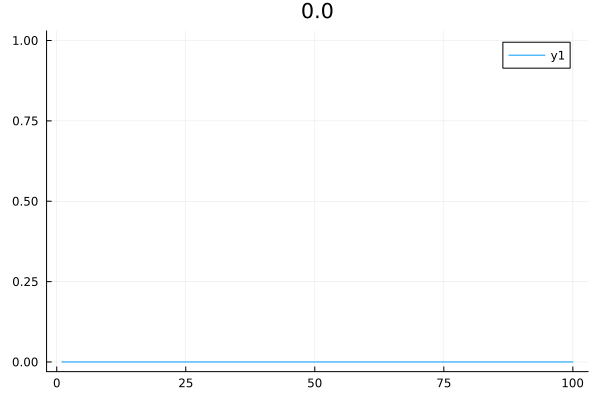

In [ ]:
solu = sol[u(x, t)]
discrete_t = sol[t]
discrete_x = sol[x]

anim = @animate for k in 1:length(discrete_t)
    plot(solu[1:end, k], title="$(discrete_t[k])")
end
gif(anim, "BeamGif.gif", fps = 20)

In [56]:
@parameters x t
@variables u(..)
Dtt = Differential(t)^2
Dx4 = Differential(x)^4
Dxx = Differential(x)^2
q(x,t) = sin(x)
EI(x,t) = 1.0 + x^2

x_min = t_min = 0.0
x_max = 10.0
t_max = 11.5

u0(x,t) = 0.0
du0(x) = 0.0

eq = [Dtt(u(x,t)) ~ q(x,t) - Dxx(EI(x,t) * Dxx(u(x,t)))]

domains = [x ∈ Interval(x_min, x_max),
              t ∈ Interval(t_min, t_max)]

# Periodic BCs
bcs = [u(x,0) ~ u0(x,0),
    Dt(u(x, 0)) ~ du0(x)] 

@named pdesys = PDESystem(eq,bcs,domains,[x,t],[u(x,t)])


PDESystem
Equations: Equation[Differential(t)(Differential(t)(u(x, t))) ~ -Differential(x)(Differential(x)((1.0 + x^2)*Differential(x)(Differential(x)(u(x, t))))) + sin(x)]
Boundary Conditions: Equation[u(x, 0) ~ 0.0, Differential(t)(u(x, 0)) ~ 0.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 10.0), Symbolics.VarDomainPairing(t, 0.0 .. 11.5)]
Dependent Variables: Num[u(x, t)]
Independent Variables: Num[x, t]
Parameters: SciMLBase.NullParameters()
Default Parameter ValuesDict{Any, Any}()

Discretization:


┌ Warning: Incompatible term found. Adding auxiliary equation var"⟦(1.0 + x^2)*Differential(x)(Differential(x)(u(x, t)))⟧"(x, t) ~ (1.0 + x^2)*Differential(x)(Differential(x)(u(x, t))) to the system.
└ @ MethodOfLines C:\Users\Owner\.julia\packages\MethodOfLines\EiZyI\src\system_parsing\pde_system_transformation.jl:227


  1.584208 seconds (9.48 M allocations: 603.090 MiB, 6.13% gc time)
Solve:
  1.277205 seconds (8.15 M allocations: 474.170 MiB, 7.11% gc time)


┌ Info: Saved animation to c:\Users\Owner\ventura-bus-door\Beam\BeamGif_EI_variable.gif
└ @ Plots C:\Users\Owner\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Owner\\ventura-bus-door\\Beam\\BeamGif_EI_variable.gif")
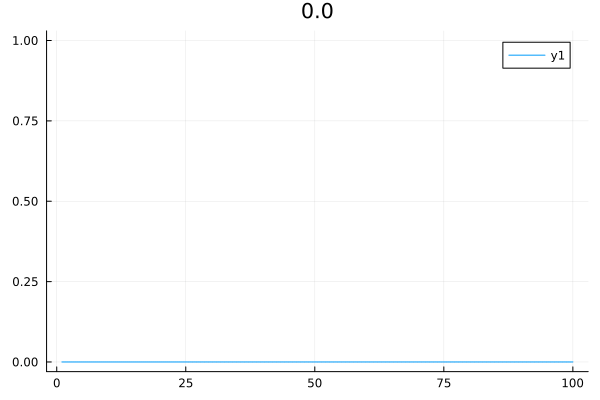

In [57]:
N = 100

order = 4 # This may be increased to improve accuracy of some schemes

# Integers for x and y are interpreted as number of points. Use a Float to directtly specify stepsizes dx and dy.
discretization = MOLFiniteDifference([x=>N], t, approx_order=order)
println("Discretization:")
@time prob = discretize(pdesys,discretization)

println("Solve:")
@time sol = solve(prob, TRBDF2(), saveat=0.01)

solu = sol[u(x, t)]
discrete_t = sol[t]
discrete_x = sol[x]

anim = @animate for k in 1:length(discrete_t)
    plot(solu[1:end, k], title="$(discrete_t[k])")
end
gif(anim, "BeamGif_EI_variable.gif", fps = 20)